In [23]:
import cv2 as cv2
import yaml
import numpy as np
import os
import time
import boto3
import tensorflow as tf

In [24]:
COLOR_BLACK = (0, 0, 0)
COLOR_BLUE = (0, 0, 255)
COLOR_GREEN = (0, 255, 0)
COLOR_RED = (255, 0, 0)
COLOR_WHITE = (255, 255, 255)

In [25]:
VIDEO_SOURCE = "/Users/Harshitha/Desktop/Harshitha/Data/version1.mp4"
output="/Users/Harshitha/Desktop/Data/OccupancyDetection_Keras_1.mp4"
coordinatesFile = "/Users/Harshitha/Desktop/Data/coordinate_keras.yml"
model_path = "/Users/Harshitha/Downloads/Keras_Weights_final.h5"

In [26]:
def show(image):
    plt.figure(figsize=(15, 12))
    plt.imshow(image)
    plt.show()

In [27]:
stream = cv2.VideoCapture(VIDEO_SOURCE)

In [28]:
video_info = {  'fps':    stream.get(cv2.CAP_PROP_FPS),
                'width':  int(stream.get(cv2.CAP_PROP_FRAME_WIDTH)*0.6),
                'height': int(stream.get(cv2.CAP_PROP_FRAME_HEIGHT)*0.6),
                'fourcc': stream.get(cv2.CAP_PROP_FOURCC),
                'num_of_frames': int(stream.get(cv2.CAP_PROP_FRAME_COUNT))}

frame_width = int(stream.get(3))
frame_height = int(stream.get(4))
#print(frame_width,frame_height)

size = (frame_width, frame_height)
#print(size)

outputVideo = cv2.VideoWriter(output,cv2.VideoWriter_fourcc('X','V','I','D'),5,size)

In [29]:
print(video_info)
bounds = []
contours=[]

{'fps': 29.97, 'width': 768, 'height': 432, 'fourcc': 828601953.0, 'num_of_frames': 12738}


In [30]:
with open(coordinatesFile, "r") as data:
    points = yaml.load(data)
    for c in points:
        coordinates=np.array(c["coordinates"])
        rect = cv2.boundingRect(coordinates)
        #print(coordinates)
        new_points = coordinates.copy()
        new_points[:,0] = coordinates[:,0] - rect[0]
        new_points[:,1] = coordinates[:,1] - rect[1]
        contours.append(points)
        bounds.append(rect)

In [31]:
new_model = tf.keras.models.load_model(model_path)
new_model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_20 (Conv2D)           (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 74, 74, 32)        0         
_________________________________________________________________
dropout_20 (Dropout)         (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 36, 36, 64)        0         
_________________________________________________________________
dropout_21 (Dropout)         (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 34, 34, 128)      

In [32]:
def updateDB(slotnumber,slot_status):
    
    current_time = time.strftime("%m-%d-%Y %H:%M:%S")
    #print(slotnumber,slot_status,current_time)
    dynamodb = boto3.resource('dynamodb',region_name='us-east-2')
    table = dynamodb.Table('SlotInformation')
    #print(slot_status,current_time)
    table.update_item(
    Key={
        'Slot': slotnumber
    },
    UpdateExpression='SET SlotStatus = :val1',
    ExpressionAttributeValues={
        ':val1': slot_status
    }
    )
    table.update_item(
    Key={
        'Slot': slotnumber
    },
    UpdateExpression='SET SlotTime = :val1',
    ExpressionAttributeValues={
        ':val1': current_time
    }
)

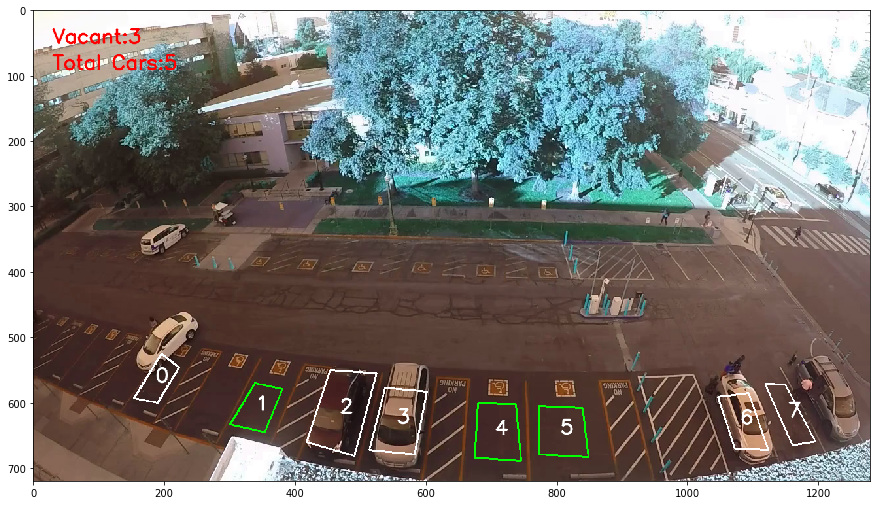

0


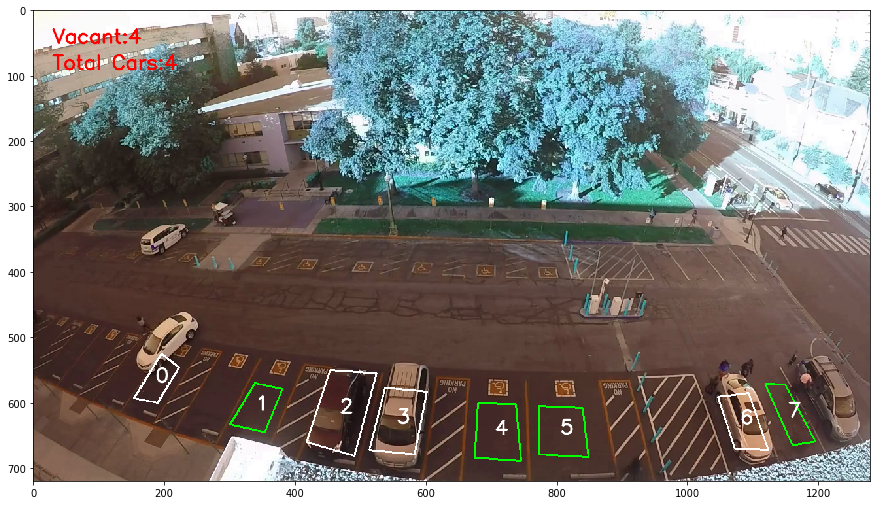

30


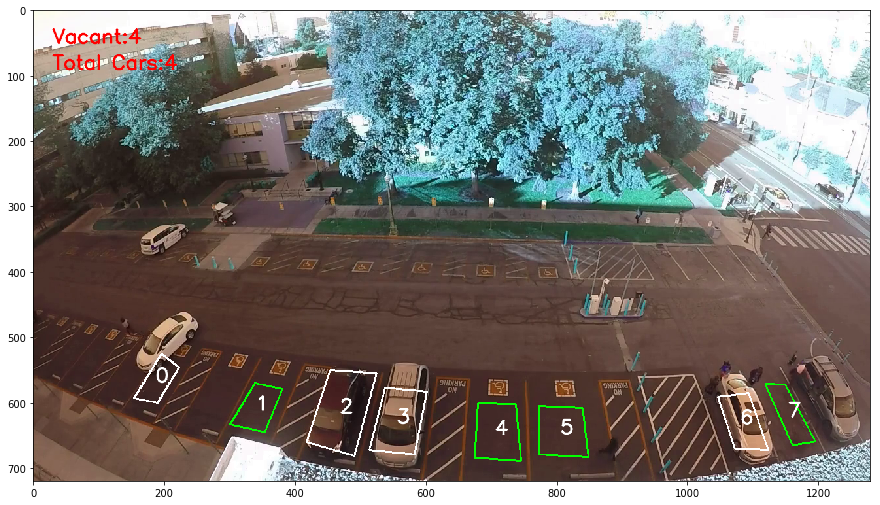

60


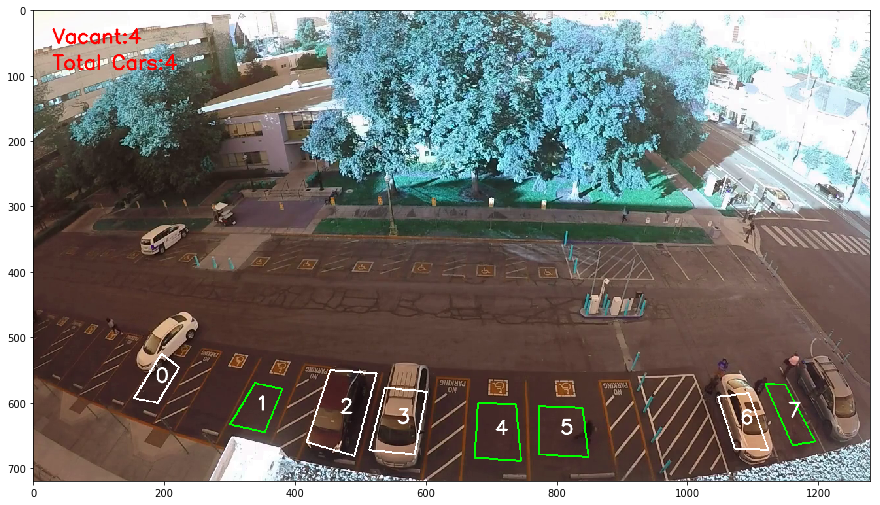

90


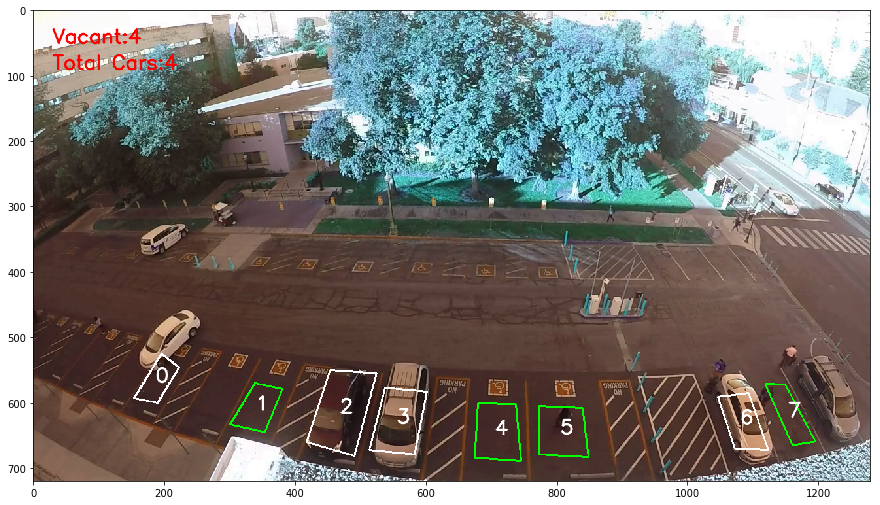

120


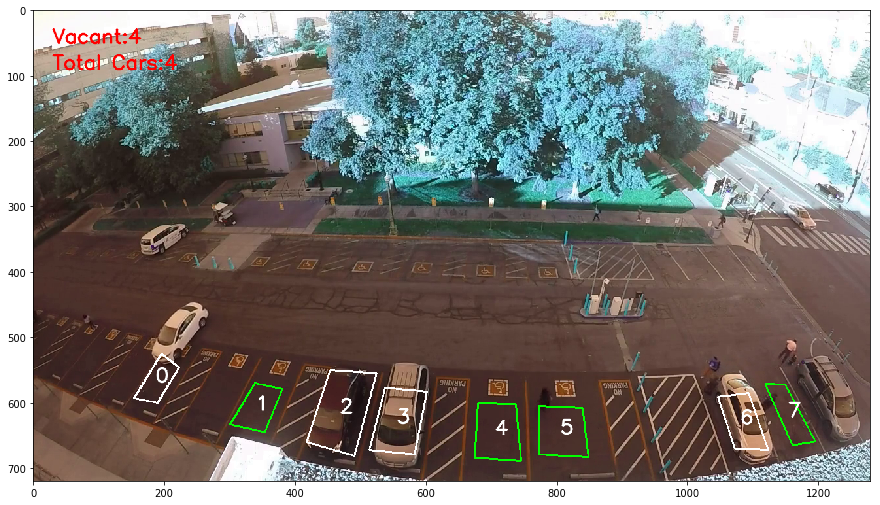

150


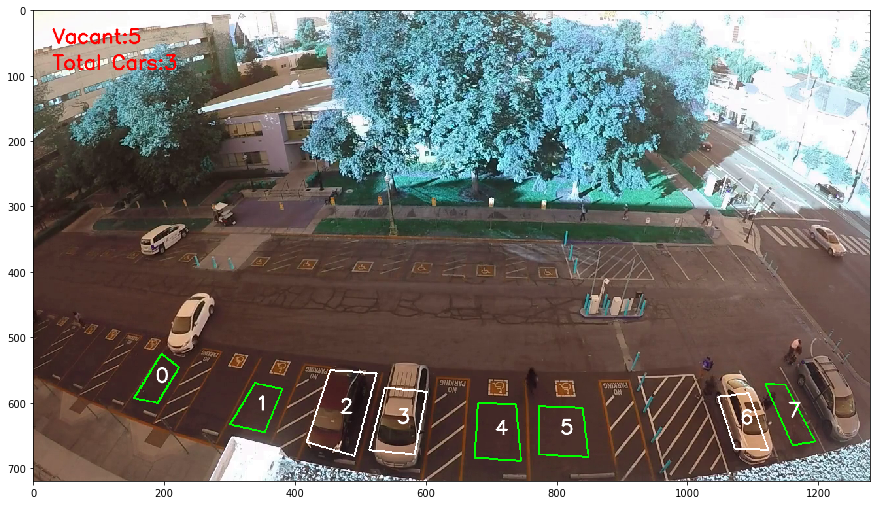

180


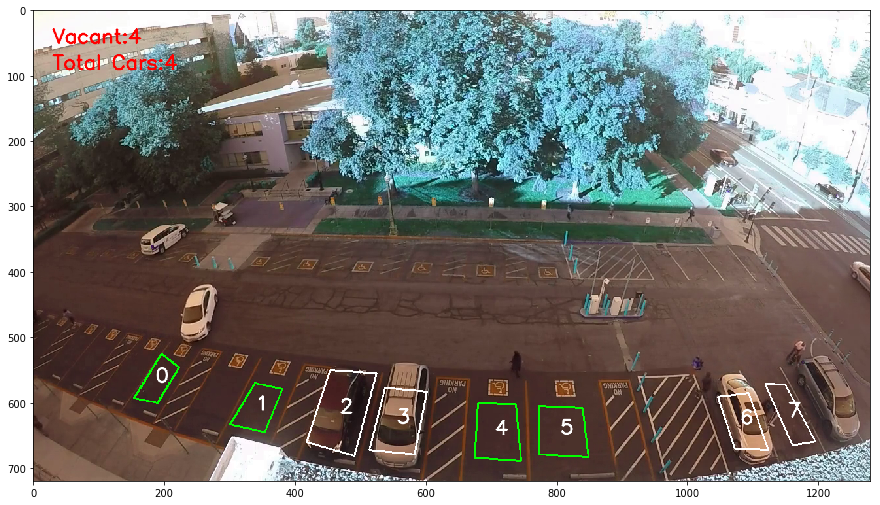

210


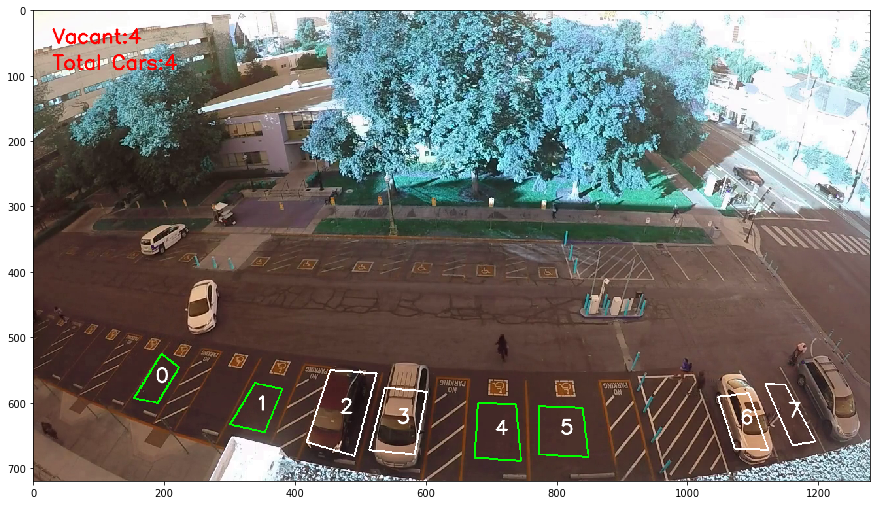

240


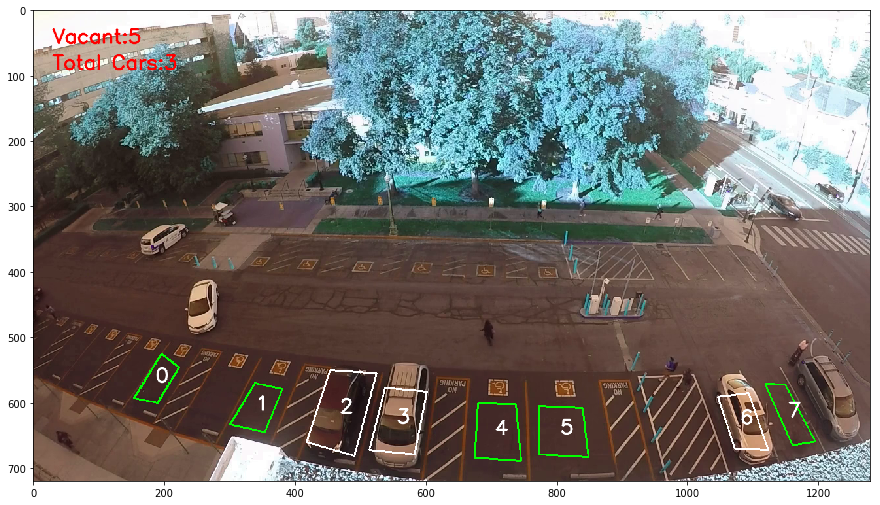

270


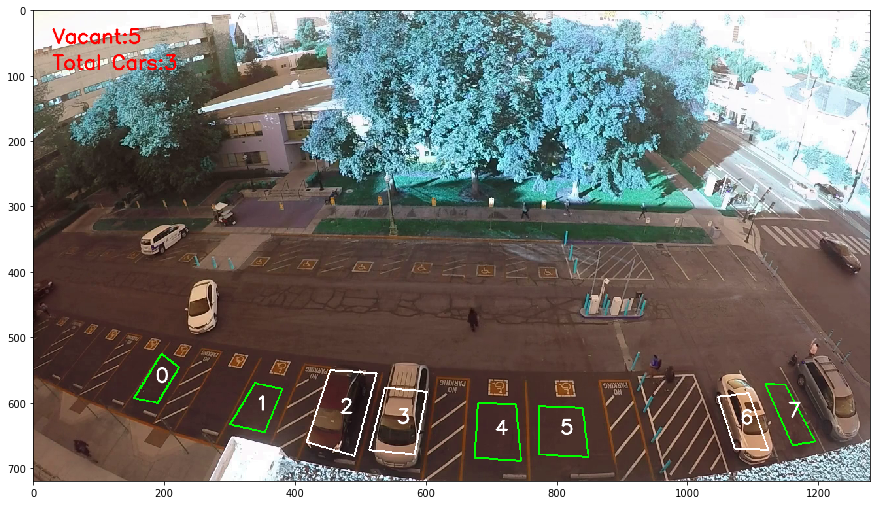

300
130.65638709068298


In [33]:
import matplotlib.pyplot as plt
import time
start = time.time()
count=0
while stream.isOpened():
    success,image= stream.read()
    if not success:
        print("video done")
        break
    
    if(count%30 == 0):
        
        image_copy = image.copy()
        car_count = 0
        vacant_slots = 0
        class_ids = []
        confidences = []
        boxes = []
        for index, coordinate in enumerate(points):
            carExists = 0
            coordinates=np.array(coordinate["coordinates"])
            slot=np.array(coordinate["id"])
            rect = bounds[index]
            roi_gray = image[rect[1]:(rect[1]+rect[3]), rect[0]:(rect[0]+rect[2])]
            (H, W) = roi_gray.shape[:2]
            roi_gray = tf.image.resize(roi_gray, [150, 150])
            img = (np.expand_dims(roi_gray,0))
            predictions = new_model.predict(img)
            carExists = np.argmax(predictions[0])
            if carExists == 0:
                car_count = car_count +1
                colour = COLOR_WHITE
                slot_status = 'occupied'
            else:
                vacant_slots = vacant_slots + 1
                colour = COLOR_GREEN
                slot_status = 'Empty'
            slotnumber = coordinate["id"]
            updateDB(slotnumber, slot_status)
            cv2.drawContours(image_copy, [coordinates], contourIdx=-1,color=colour, thickness=2, lineType=cv2.LINE_8)
            moments = cv2.moments(coordinates)
            center = (int(moments["m10"] / moments["m00"]) - 3,
                         int(moments["m01"] / moments["m00"]) + 3)
            label = str(coordinate["id"])
            cv2.putText(image_copy,label,center,cv2.FONT_HERSHEY_SIMPLEX,1,COLOR_WHITE,2,cv2.LINE_AA)


        vacant_label = str("Vacant:")+ str(vacant_slots) 
        car_label = str("Total Cars:") + str(car_count)
        cv2.putText(image_copy,vacant_label,(30,50),cv2.FONT_HERSHEY_SIMPLEX,1,COLOR_RED,2,cv2.LINE_AA) 
        cv2.putText(image_copy,car_label,(30,90),cv2.FONT_HERSHEY_SIMPLEX,1,COLOR_RED,2,cv2.LINE_AA)


        #show(image_copy)
        print(count)
        outputVideo.write(image_copy)

    #if count==300:
        #end = time.time()
        #print(end - start)
        #break
    count = count + 1 
    
stream.release()
outputVideo.release()
cv2.destroyAllWindows()

